In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import tensorly as tl
import hyperspy.api as hs
import matplotlib.pyplot as plt
from tensorly.decomposition import tucker
from mpl_toolkits.axes_grid1 import AxesGrid

<ipython-input-2-48f7d655fd81>:12: MatplotlibDeprecationWarning: Since 3.2, mpl_toolkits's own colorbar implementation is deprecated; it will be removed two minor releases later.  Set the 'mpl_toolkits.legacy_colorbar' rcParam to False to use Matplotlib's default colorbar implementation and suppress this deprecation warning.
  grid.cbar_axes[0].colorbar(im)
C:\Users\sning\anaconda3\lib\site-packages\mpl_toolkits\axes_grid1\axes_grid.py:46: MatplotlibDeprecationWarning: 
The mpl_toolkits.axes_grid1.colorbar module was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use matplotlib.colorbar instead.
  from .colorbar import Colorbar
<ipython-input-2-48f7d655fd81>:15: MatplotlibDeprecationWarning: Since 3.2, mpl_toolkits's own colorbar implementation is deprecated; it will be removed two minor releases later.  Set the 'mpl_toolkits.legacy_colorbar' rcParam to False to use Matplotlib's default colorbar implementation and suppress this deprecation warning.
  grid.cb

Text(0.5, 1.0, 'FFT Frame')

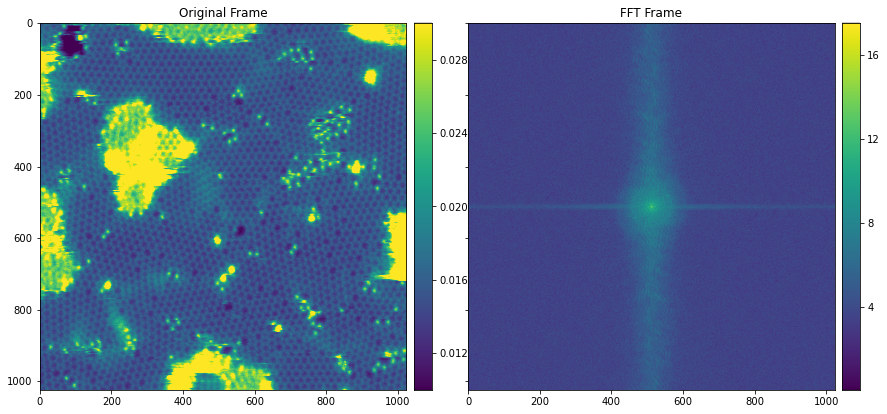

In [2]:
EMImage = np.array(hs.load("BCN-300/SuperScan-MAADFABF-17_7.dm3"))
FFTImage = np.fft.fftshift(np.fft.fft2(EMImage))
fig =plt.figure(1, figsize=(50, 50))
grid=AxesGrid(fig, 236, nrows_ncols=(1,2),
             axes_pad=0.5,
             share_all=False,
             cbar_location="right",
             cbar_mode="each",
             cbar_size="5%",
             cbar_pad="2%")
im=grid[0].imshow(EMImage, cmap=plt.cm.viridis, vmax = 0.03, vmin = 0.01)
grid.cbar_axes[0].colorbar(im)
grid[0].set_title("Original Frame")
im=grid[1].imshow(np.log2(np.abs(FFTImage)*10+1.0), cmap=plt.cm.viridis)
grid.cbar_axes[1].colorbar(im)
grid[1].set_title("FFT Frame")

In [3]:
def DoubleGaussian(r):
    inner_sigma = 80
    outer_sigma = 80
    radius = 100.0
    weight = np.exp(-0.5*(r-radius)*(r-radius)/(outer_sigma*outer_sigma))*np.exp(-0.5*r*r/(inner_sigma*inner_sigma))
    return weight
def Trunc(r):
    weight = np.zeros_like(r)
    weight[np.where(r<100.0)]=1.0
    return weight

Text(0.5, 1.0, 'filter weight profiles')

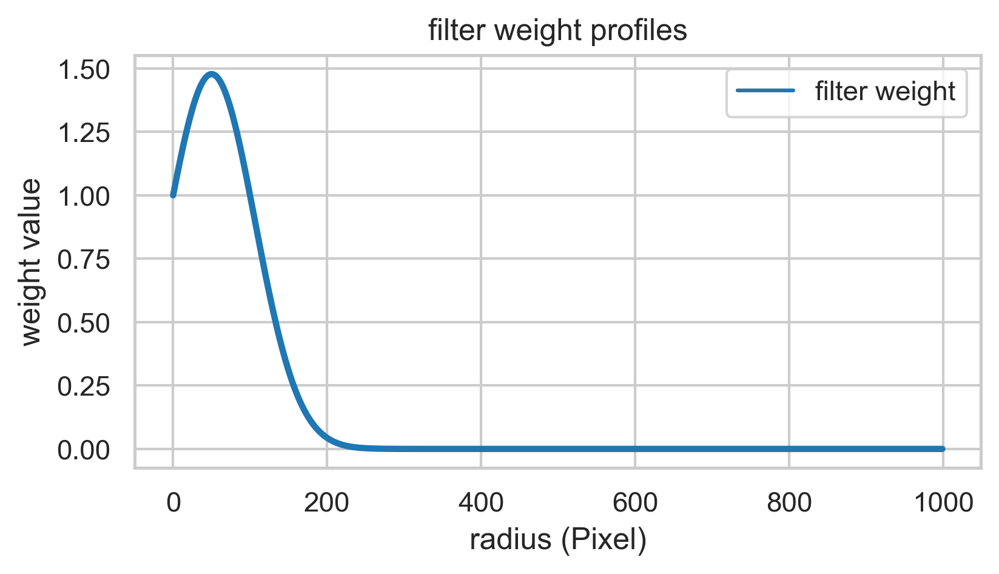

In [4]:
#denoise the image using Guassian filter
r = np.linspace(0, 1000, 1000)
weight = DoubleGaussian(r)/DoubleGaussian(0)
plt.rcParams['figure.figsize'] = (6.0, 3.0)
plt.rcParams['figure.dpi'] = 300
EM_data=np.column_stack((weight,))
sns.set(style="whitegrid")
data = pd.DataFrame(EM_data, columns=["filter weight"])
plot= sns.lineplot(data=data, palette="tab10", linewidth=2.5)
plt.ylabel('weight value')
plt.xlabel('radius (Pixel)')
plot.set_title('filter weight profiles')

<ipython-input-5-7d39b51c64f0>:18: MatplotlibDeprecationWarning: Since 3.2, mpl_toolkits's own colorbar implementation is deprecated; it will be removed two minor releases later.  Set the 'mpl_toolkits.legacy_colorbar' rcParam to False to use Matplotlib's default colorbar implementation and suppress this deprecation warning.
  grid.cbar_axes[0].colorbar(im)
<ipython-input-5-7d39b51c64f0>:21: MatplotlibDeprecationWarning: Since 3.2, mpl_toolkits's own colorbar implementation is deprecated; it will be removed two minor releases later.  Set the 'mpl_toolkits.legacy_colorbar' rcParam to False to use Matplotlib's default colorbar implementation and suppress this deprecation warning.
  grid.cbar_axes[1].colorbar(im)


Text(0.5, 1.0, 'FFT Frame')

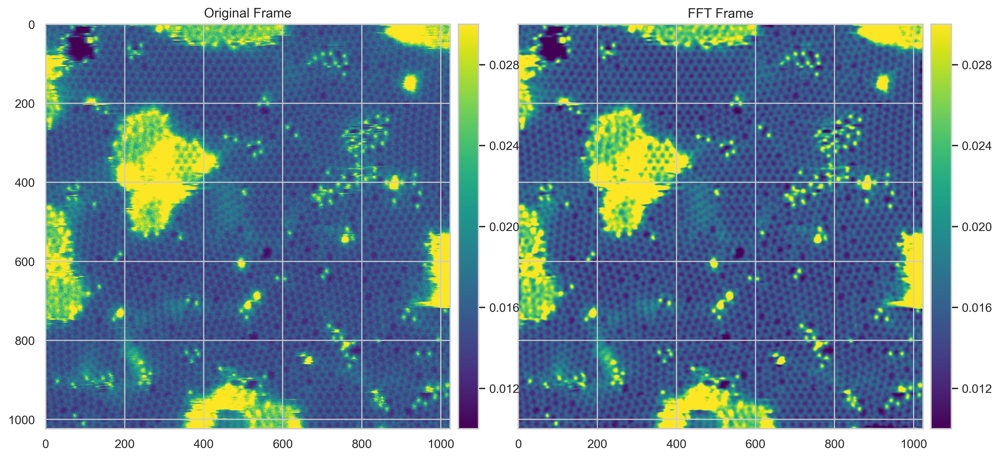

In [5]:
#apply the above filtering
X, Y = np.meshgrid(np.arange(0, EMImage.shape[1]), np.arange(0, EMImage.shape[0]))
X -=  int(EMImage.shape[1]/2)
Y -=  int(EMImage.shape[0]/2)
radius = np.sqrt(X*X+Y*Y)
weight = DoubleGaussian(radius)/DoubleGaussian(0)
#weight = Trunc(radius)
EMFilter = np.real(np.fft.ifft2(np.fft.ifftshift(weight*FFTImage)))
fig =plt.figure(1, figsize=(50, 50))
grid=AxesGrid(fig, 236, nrows_ncols=(1,2),
             axes_pad=0.5,
             share_all=False,
             cbar_location="right",
             cbar_mode="each",
             cbar_size="5%",
             cbar_pad="2%")
im=grid[0].imshow(EMImage, cmap=plt.cm.viridis, vmax = 0.03, vmin = 0.01)
grid.cbar_axes[0].colorbar(im)
grid[0].set_title("Original Frame")
im=grid[1].imshow(EMFilter, cmap=plt.cm.viridis, vmax = 0.03, vmin = 0.01)
grid.cbar_axes[1].colorbar(im)
grid[1].set_title("FFT Frame")

In [6]:
subrow = 64
subcol = 64
step_size =16
sub3D = []
overlap = np.zeros_like(EMFilter)
row_num = int((EMFilter.shape[0]-subrow)/step_size+1)
col_num = int((EMFilter.shape[1]-subcol)/step_size+1)
for i in range(row_num):
    for j in range(col_num):
        overlap[i*step_size:i*step_size+subrow,j*step_size:j*step_size+subcol] +=1;
        sub3D.append(EMFilter[i*step_size:i*step_size+subrow,j*step_size:j*step_size+subcol].copy())
sub3D = np.asarray(sub3D)

In [7]:
#tensor decomposition and remove random noise.
tucker_rank = [120, subrow, subcol]
core, tucker_factors = tucker(np.float64(sub3D), rank = tucker_rank, init='random', tol=10e-9)
denoised3D = tl.tucker_to_tensor((core, tucker_factors))

In [8]:
EMDenoise = np.zeros(EMFilter.shape,denoised3D.dtype)
for i in range(row_num):
    for j in range(col_num):
        EMDenoise[i*step_size:i*step_size+subrow,j*step_size:j*step_size+subcol]+=denoised3D[i*col_num+j,:,:]
EMDenoise/=overlap

<ipython-input-9-fb1ab446c97d>:10: MatplotlibDeprecationWarning: Since 3.2, mpl_toolkits's own colorbar implementation is deprecated; it will be removed two minor releases later.  Set the 'mpl_toolkits.legacy_colorbar' rcParam to False to use Matplotlib's default colorbar implementation and suppress this deprecation warning.
  grid.cbar_axes[0].colorbar(im)
<ipython-input-9-fb1ab446c97d>:13: MatplotlibDeprecationWarning: Since 3.2, mpl_toolkits's own colorbar implementation is deprecated; it will be removed two minor releases later.  Set the 'mpl_toolkits.legacy_colorbar' rcParam to False to use Matplotlib's default colorbar implementation and suppress this deprecation warning.
  grid.cbar_axes[1].colorbar(im)


Text(0.5, 1.0, 'FFT Frame')

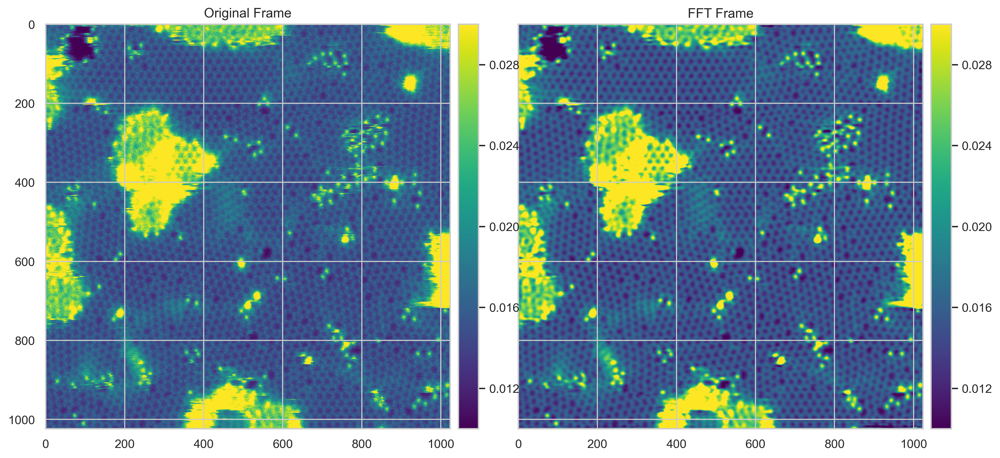

In [9]:
fig =plt.figure(1, figsize=(50, 50))
grid=AxesGrid(fig, 236, nrows_ncols=(1,2),
             axes_pad=0.5,
             share_all=False,
             cbar_location="right",
             cbar_mode="each",
             cbar_size="5%",
             cbar_pad="2%")
im=grid[0].imshow(EMImage, cmap=plt.cm.viridis, vmax = 0.03, vmin = 0.01)
grid.cbar_axes[0].colorbar(im)
grid[0].set_title("Original Frame")
im=grid[1].imshow(EMDenoise, cmap=plt.cm.viridis, vmax = 0.03, vmin = 0.01)
grid.cbar_axes[1].colorbar(im)
grid[1].set_title("FFT Frame")

In [10]:
np.save("denoised.npy", EMDenoise)
np.save("filtered.npy", EMFilter)